In [396]:
import numpy as np 
import pandas as pd 
import matplotlib. pyplot as plt  
import seaborn as sns
import matplotlib.scale 
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore") 
import re

import random
import nltk
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer

import sklearn
import sklearn.metrics as metrics
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc as auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from tabulate import tabulate
from collections import  Counter


[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\megia\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\megia\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\megia\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\megia\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Preparing data/outputs

In [235]:
def preprocess_data(dataframe : pd.DataFrame, colname : str, remove_stopwords = False):

    df1=dataframe.copy()
    
    df1 = df1.astype({colname: str})   
    df1  = df1.replace(r'\r+|\n+|\t+',' ', regex=True)
    
    #Remove special characters
    df1[colname] = df1[colname].apply(lambda x: re.sub(r"(@\[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", "", str(x)))
    df1[colname] = df1[colname].str.replace('[^\w\s]','')
    df1[colname] = df1[colname].str.replace('\d+', '')
    df1[colname] = df1[colname].apply(lambda x: re.sub(' +', ' ', str(x)))

    return df1

In [236]:
#Load data
df_tst = pd.read_csv('C:/Users/megia/Desktop/PML/data/test.csv', delimiter=',')
df_tst_labels = pd.read_csv('C:/Users/megia/Desktop/PML/data/test_labels.csv', delimiter=',')
df_tr = pd.read_csv('C:/Users/megia/Desktop/PML/data/train.csv', delimiter=',')

outputs_csv = pd.read_csv('C:/Users/megia/Desktop/PML/data/submission_bert.csv', delimiter=',')
outputs_csv_db = pd.read_csv('C:/Users/megia/Desktop/PML/data/submission_dbert.csv', delimiter=',')
#outputs_mb = pd.read_csv('C:/Users/megia/Desktop/PML/data/submission_mbert.csv', delimiter=',')


classes = ['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']

In [349]:
df_tst = preprocess_data(df_tst, 'comment_text')
df_tr = preprocess_data(df_tr, 'comment_text')

In [238]:
def remove_unlabeled(outputs, df_tst = df_tst, df_tst_labels = df_tst_labels):
    outputs_cp = outputs.copy()
    outputs_cp.rename(columns = {'toxic':'pred_toxic', 'severe_toxic': 'pred_severe_toxic', 'obscene': 'pred_obscene', 'threat': 'pred_threat', 'insult': 'pred_insult', 'identity_hate': 'pred_identity_hate'}, inplace = True)
    
    df_bert = pd.concat([df_tst, df_tst_labels.iloc[:, 1:], outputs_cp.iloc[:, 1:]], axis=1)
    df_bert = df_bert[df_bert.toxic != -1].reset_index(drop=True) 
    outputs['labeled'] = df_tst_labels['toxic']
    
    outputs= outputs[outputs.labeled != -1].iloc[:, :-1].reset_index(drop = True)
    
    return outputs, df_bert

outputs, df_bert = remove_unlabeled(outputs_csv)
outputs_db, df_dbert = remove_unlabeled(outputs_csv_db)

test_labels = df_bert.iloc[:,:8]

In [471]:
test_labels.head(44887)

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0001ea8717f6de06,Thank you for understanding I think very highly of you and would not revert without discussion,0,0,0,0,0,0
1,000247e83dcc1211,Dear god this site is horrible,0,0,0,0,0,0
2,0002f87b16116a7f,Somebody will invariably try to add Religion Really You mean the way people have invariably kept adding Religion to the Samuel Beckett infobox And why do you bother bringing up the longdead completely nonexistent Influences issue Youre just flailing making up crap on the fly For comparison the only explicit acknowledgement in the entire Amos Oz article that he is personally Jewish is in the categories,0,0,0,0,0,0
3,0003e1cccfd5a40a,It says it right there that it IS a type The Type of institution is needed in this case because there are three levels of SUNY schools University Centers and Doctoral Granting Institutions State Colleges Community Colleges It is needed in this case to clarify that UB is a SUNY Center It says it even in Binghamton University University at Albany State University of New York and Stony Brook University Stop trying to say its not because I am totally right in this case,0,0,0,0,0,0
4,00059ace3e3e9a53,Before adding a new product to the list make sure its relevant Before adding a new product to the list make sure it has a wikipedia entry already proving its relevance and giving the reader the possibility to read more about it Otherwise it could be subject to deletion See this articles revision history,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
44882,b2cd3a36c64b3c32,Hi Nergaal Hi Nergaal you missed a lot of fun in the wikicup and a nice interview in the signpost during your break Hope to get a little work in the periodic table soon,0,0,0,0,0,0
44883,b2cec1dad73c6580,It occurs to me that I am talking about the situation in the UK Other jurisdictions may vary,0,0,0,0,0,0
44884,b2d00a1e0b5d7585,Sexism Why are females being considered the only gender that Tetrachromacy can occur in it occurs on the X chromosome therefore men can have it period,0,0,0,0,0,0
44885,b2d01d86cc594275,War in popular culture I reverted this change to War in popular culture The links you removed seem relevant Also I have not come across the term American War of Northern Aggression elsewhere Perhaps MexicanAmerican War would be a better title,0,0,0,0,0,0


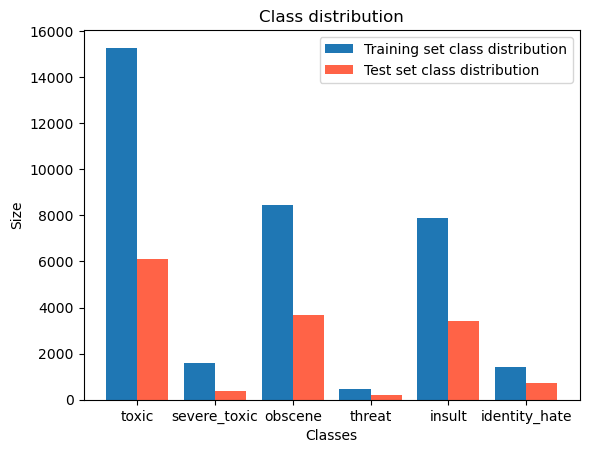

In [239]:
#df_bert['nontoxic'] = pd.Series([int(sum(df_bert[classes].iloc[i]) ==0) for i in range(len(df_bert))])
nontoxic = 57735

class_dist = df_bert[classes].apply(pd.value_counts)
tr_class_dist = df_tr[classes].apply(pd.value_counts)

X_axis = np.arange(len(classes))

plt.bar(X_axis - 0.2, tr_class_dist.values.tolist()[1], 0.4, label = 'Training set class distribution')
plt.bar(X_axis + 0.2, class_dist.values.tolist()[1], 0.4, label = 'Test set class distribution', color = 'tomato')
  
plt.xticks(X_axis, classes)
plt.xlabel("Classes")
plt.ylabel("Size")
plt.title("Class distribution")
plt.legend()
plt.show()

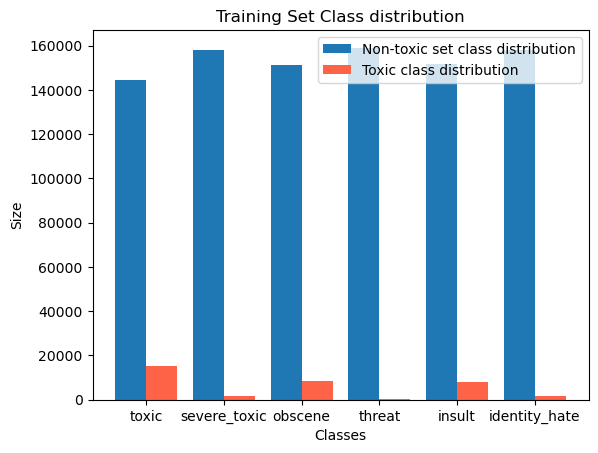

In [474]:
X_axis = np.arange(len(classes))

plt.bar(X_axis - 0.2, tr_class_dist.values.tolist()[0], 0.4, label = 'Non-toxic set class distribution')
plt.bar(X_axis + 0.2, tr_class_dist.values.tolist()[1], 0.4, label = 'Toxic class distribution', color = 'tomato')
  
plt.xticks(X_axis, classes)
plt.xlabel("Classes")
plt.ylabel("Size")
plt.title("Training Set Class distribution")
plt.legend()
plt.show()

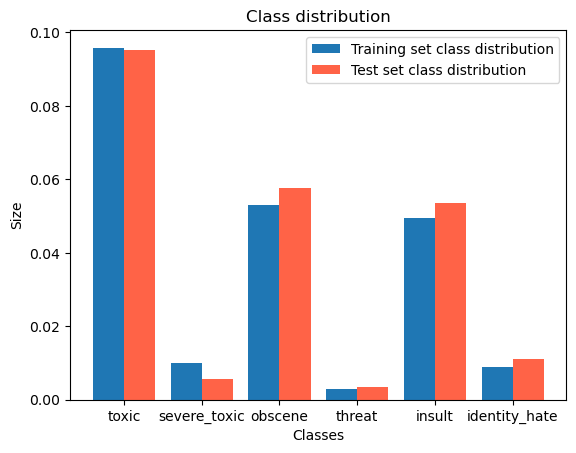

In [240]:
class_freq = [x/len(df_bert) for x in class_dist.values.tolist()[1]]
tr_class_freq = [x/len(df_tr) for x in tr_class_dist.values.tolist()[1]]

X_axis = np.arange(len(classes))

plt.bar(X_axis - 0.2, tr_class_freq, 0.4, label = 'Training set class distribution')
plt.bar(X_axis + 0.2, class_freq, 0.4, label = 'Test set class distribution', color = 'tomato')
  
plt.xticks(X_axis, classes)
plt.xlabel("Classes")
plt.ylabel("Size")
plt.title("Class distribution")
plt.legend()
plt.show()

## ROC AUC, log loss, F1 score

In [241]:
def roc_auc(outputs, model_name, test_labels = test_labels ,classes = classes):    
    
    roc_auc_scores = []
    
    for category in classes:
        roc_auc_scores += [roc_auc_score(test_labels[category].astype(int), outputs[category])]
    print(model_name)
    
    data = list(zip(classes, roc_auc_scores))
    col_names = ['Class', 'Score' ]
    print(tabulate(data, headers=col_names, tablefmt="fancy_grid"))
   
    print(f"average score {sum(roc_auc_scores)/len(roc_auc_scores)}\n")
    
    return data
    
#roc_auc(outputs, 'BERT')
#roc_auc(outputs_db, 'DistilBERT')

In [242]:
def log_loss(outputs, classes = classes, df_true=df_bert):
    
    df = df_true.copy()
    df['log_loss'] = 1

    y_true  = df_true[classes]
    y_pred = outputs[classes]


    for index, row in y_pred.iterrows():
        df["log_loss"][index]=metrics.log_loss(y_true.loc[[index]], y_pred.loc[[index]])

    df = df[df.log_loss > 0]
    df = df.sort_values(by=['log_loss'], ascending=True)
    df = df.reset_index(drop=True) 
    
    return df

In [243]:
def best_pred_threshold(logits, test_labels, model_name = 'BERT', show_graph = False, classes = classes, test_data = df_bert):
    
    '''
    Returns decision thresholds that produce the best F1 score and the respective scores
    
    
    '''
    
    if show_graph:
        fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3)
        axes = [ax1,ax2,ax3, ax4, ax5,ax6]
        fig.suptitle('F1 at different thresholds')

    predictions = pd.DataFrame(columns = ['comment_text'] + [category for category in classes])
    predictions['comment_text'] = test_labels['comment_text']
    aucs = []
    best_pred_thresholds = []
    intervall = np.linspace(0,1,21)

    
    print('\n', model_name)
    
    
    for i,category in enumerate(classes):
    
        labels = test_labels[category].to_numpy().astype(int)
        probs = logits[category]
        f1 = []
        
        for threshold in intervall:
            
            preds = [0 if x <threshold else 1 for x in probs]
            f1 += [metrics.f1_score(labels, preds)] 
        #print('\nclass:', category, ', f1:', f1)
    
        f1 = np.array(f1)
        best_pred_thresholds +=[intervall[np.argmax(f1)]]
              
        predictions[category] = [0 if x<best_pred_thresholds[i] else 1 for x in probs]
        
        
        if show_graph:
            print('{}: best threshold = {}, best f1 = {}'.format(category, intervall[np.argmax(f1)].round(3), max(f1).round(3)))

            ax = axes[i]

            ax.plot(intervall, np.array(f1), marker='.')
            # axis labels
            ax.set_title(category, color = 'gray')
    
            for ax in fig.get_axes():
                ax.label_outer()

            fig.text(0.5, 0.01, 'Threshold', ha='center', va='center')
            fig.text(0.02, 0.5, 'F1', ha='center', va='center', rotation='vertical')

    return predictions, best_pred_thresholds


#preds_f1, thresholds = best_pred_threshold(outputs, test_labels, model_name = 'BERT', show_graph = True)
#preds_f1_db, thresholds_db = best_pred_threshold(outputs_db, test_labels, model_name = 'DistilBERT', show_graph = True)

## Calculate predictions from probabilities

In [244]:
def calc_predictions(probs = outputs, y_true = df_bert, classes=classes, thresholds = None):
    
    probs = probs.reset_index(drop=True)
    y_true = y_true.reset_index(drop=True)

    predictions = pd.concat([y_true.loc[:, ['comment_text'] + classes].rename(columns = {'toxic':'true_toxic', 'severe_toxic': 'true_severe_toxic', 'obscene': 'true_obscene', 'threat': 'true_threat', 'insult': 'true_insult', 'identity_hate': 'true_identity_hate'}),
                                 probs.loc[:, classes].rename(columns = {'toxic':'prob_toxic', 'severe_toxic': 'prob_severe_toxic', 'obscene': 'prob_obscene', 'threat': 'prob_threat', 'insult': 'prob_insult', 'identity_hate': 'prob_identity_hate'})], 
                                axis=1)

    preds = pd.DataFrame(columns = classes)
    for i,category in enumerate(classes):  
        threshold = 0.5
        if thresholds!= None:
            threshold = thresholds[i]            
        preds[category] = [0 if x<threshold else 1 for x in probs[category]] 
            
    predictions = pd.concat([predictions['comment_text'], preds, predictions.iloc[:, 1:]], axis=1)
    
    return predictions

## Accuracy

In [245]:
#Which accuracy function should I use?

def class_accuracy(y_probs, model_name, thresholds = None, y_true = df_bert, balanced = True, adj = False):
    
    acc = []
    y_preds = calc_predictions(probs = y_probs, y_true = y_true, thresholds = thresholds)
    for category in classes:
        if balanced:
            acc += [metrics.balanced_accuracy_score(y_true[category].astype(int),y_preds[category], adjusted = adj)]
        else: 
            acc += [metrics.accuracy_score(y_true[category].astype(int),y_preds[category])]
            
    print(model_name, 'Accuracy') 
    data = list(zip(classes, acc))
    col_names = ['Class', 'Accuracy' ]
    print(tabulate(data, headers=col_names, tablefmt="fancy_grid"))
   
    print(f"average score {sum(acc)/len(acc)}\n")
    
    return data 


## PIEs / CIEs

In [246]:
predictions = calc_predictions(outputs)
predictions_db = calc_predictions(outputs_db)

In [247]:
def get_non_PIEs(model = 'BERT', preds = predictions, preds_1 = predictions_db, classes = classes):
    
    if model != 'BERT':
        preds, preds_1 = preds_1, preds
        

    
    columns = preds_1.columns.values.tolist()
    preds_1 = preds_1.rename(columns = {col : col + '_1' for col in columns})
    
    preds_c = pd.concat([preds, preds_1], axis = 1)
    
    for category in classes:
        preds_c = preds_c[preds_c[category] == preds_c[category + '_1']]
    
    non_PIEs_true = pd.concat([preds_c['comment_text'], preds_c.iloc[:, 7:13]], axis=1).rename(columns = {'true_toxic':'toxic', 'true_severe_toxic': 'severe_toxic', 'true_obscene': 'obscene', 'true_threat': 'threat', 'true_insult': 'insult', 'true_identity_hate': 'identity_hate'})
    non_PIEs_probs =  pd.concat([preds_c['comment_text'], preds_c.iloc[:, 13:19]], axis=1).rename(columns = {'prob_toxic':'toxic', 'prob_severe_toxic': 'severe_toxic', 'prob_obscene': 'obscene', 'prob_threat': 'threat', 'prob_insult': 'insult', 'prob_identity_hate': 'identity_hate'})
    non_PIEs_bert = preds_c.loc[:,['comment_text'] + classes]
    
    return non_PIEs_bert, non_PIEs_true, non_PIEs_probs
    

In [248]:
#BERT predictions of PIEs + true labels
def get_PIEs(model = 'BERT', preds = predictions, preds_1 = predictions_db, classes = classes):
    
    if model != 'BERT':
        preds, preds_1 = preds_1, preds    

    
    columns = preds.columns.values.tolist()
    PIE = pd.DataFrame(columns = columns)
    
    
    for category in classes:
        PIE = pd.concat([PIE, preds[preds[category]!=preds_1[category]]])
    
    PIE.reset_index(drop = True)
    
    PIEs_true = pd.concat([PIE['comment_text'], PIE.iloc[:, 7:13]], axis=1).rename(columns = {'true_toxic':'toxic', 'true_severe_toxic': 'severe_toxic', 'true_obscene': 'obscene', 'true_threat': 'threat', 'true_insult': 'insult', 'true_identity_hate': 'identity_hate'})
    PIEs_probs =  pd.concat([PIE['comment_text'], PIE.iloc[:, 13:19]], axis=1).rename(columns = {'prob_toxic':'toxic', 'prob_severe_toxic': 'severe_toxic', 'prob_obscene': 'obscene', 'prob_threat': 'threat', 'prob_insult': 'insult', 'prob_identity_hate': 'identity_hate'})
    PIEs_bert = PIE.loc[:,['comment_text'] + classes]
    
    return PIEs_bert, PIEs_true, PIEs_probs

In [249]:
#Get PIEs and non-PIEs for predictions at the 0.5 threshold
non_PIEs_bert, non_PIEs_true, non_PIEs_bert_probs = get_non_PIEs('BERT')
non_PIEs_dbert, _, non_PIEs_dbert_probs = get_non_PIEs('DistilBERT')

PIEs_bert, PIEs_true, PIEs_bert_probs = get_PIEs('BERT')
PIEs_dbert, _, PIEs_dbert_probs = get_PIEs('DistilBERT')

In [485]:
pd.set_option('display.max_colwidth', 50)
non_PIEs_true.sample(15).loc[:, ['comment_text', 'toxic']]

,comment_text,toxic
21009,and Vulva In other words no porn please,0
41452,context i appreciate the context tag because ...,0
59068,In the spirit of compromise and goodwill I hav...,0
56496,some are still digging their hole deeper,0
54467,Personal attack Please dont use revert technol...,0
9243,Yes someone is on a tear here Who dislikes Tom...,0
40125,One way of looking at this question would be ...,0
32798,Thanks for the whiny rant Now go fuck yourself,1
4283,Bullshit If you wanted no special exemptions ...,0
52544,Articles on the Police These may be instrumen...,0


## CIE subset analysis

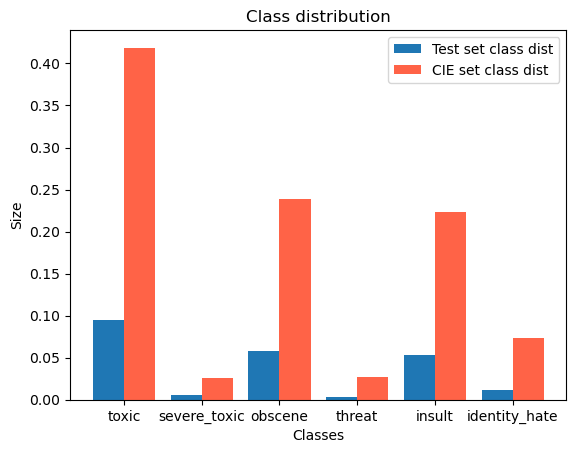

In [330]:
#okay... so PIE class distribution is almost identical to that of the whole set. underlying features that characterize PIEs?
PIE_class_dist = PIEs_true[classes].apply(pd.value_counts)

class_freq = [x/len(df_bert) for x in class_dist.values.tolist()[1]]
PIE_class_freq = [x/len(PIEs_true) for x in PIE_class_dist.values.tolist()[1]]

X_axis = np.arange(len(classes))
  
plt.bar(X_axis - 0.2, class_freq, 0.4, label = 'Test set class dist')
plt.bar(X_axis + 0.2, PIE_class_freq, 0.4, label = 'CIE set class dist', color = 'tomato')
  
plt.xticks(X_axis, classes)
plt.xlabel("Classes")
plt.ylabel("Size")
plt.title("Class distribution")
plt.legend()
plt.show()

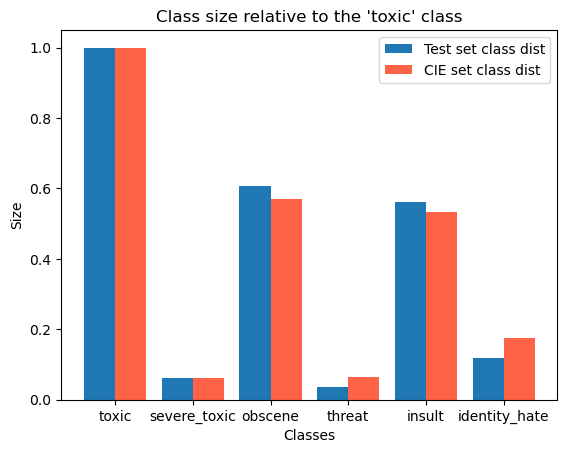

In [334]:
toxic_cls = class_dist.values.tolist()[1][0] 
PIE_toxic_cls = PIE_class_dist.values.tolist()[1][0] 

class_rel = [x/toxic_cls for x in class_dist.values.tolist()[1]]
PIE_class_rel = [x/PIE_toxic_cls for x in PIE_class_dist.values.tolist()[1]]

X_axis = np.arange(len(classes))
  
plt.bar(X_axis - 0.2, class_rel, 0.4, label = 'Test set class dist')
plt.bar(X_axis + 0.2, PIE_class_rel, 0.4, label = 'CIE set class dist', color = 'tomato')
  
plt.xticks(X_axis, classes)
plt.xlabel("Classes")
plt.ylabel("Size")
plt.title("Class size relative to the 'toxic' class")
plt.legend()
plt.show()

In [251]:
PIEs_reset = PIEs_true.reset_index(drop = True)
PIEs_reset['nontoxic'] = pd.Series([int(sum(PIEs_reset[classes].iloc[i]) ==0) for i in range(len(PIEs_reset))])
PIEs_reset[classes + ['nontoxic']].apply(pd.value_counts)
nontoxic_PIE = 2588
toxic_PIE = 1969

In [252]:
print(1969/(len(df_bert) - nontoxic), 1969 / (1969 + 2588))

0.3153932404292808 0.43208251042352425


In [427]:
PIE_labels=PIEs_true[classes].copy()
PIE_labels['non-toxic'] = [int(sum(PIE_labels.iloc[i]) ==0) for i in range(len(PIE_labels))] # is this correct?
PIE_counts = PIE_labels.apply(pd.value_counts)
PIE_counts_list = counts.values.tolist()[1]
#important: 1) our models disagree on TOXIC examples. thats ~20% of toxic examples. 2) how to show that positive class size correlates with error? 
counts

,toxic,severe_toxic,obscene,threat,insult,identity_hate,non-toxic
0,2648,4438,3471,4432,3542,4224,1969
1,1909,119,1086,125,1015,333,2588


## Data visualization

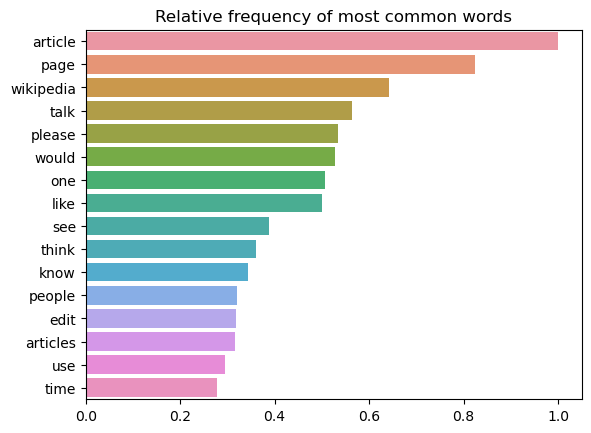

In [371]:
def plot_top_non_stopwords_barchart(text, subset):
    stop=stopwords.words('english') + ['I', 'is', 'you', 'the', 'a', 'must', 'youi', 'dont', 'u', 'also', 'im', 'may']
    
    new= text.str.split()
    new=new.values.tolist()
    corpus=[word.lower() for i in new for word in i]

    counter=Counter(corpus)
    most=counter.most_common()
    x, y=[], []
    for word,count in most[:90]:
        if len(y)>15:
            break
        if (word not in stop):
            x.append(word)
            y.append(count)
    max_count = max(y)
    y = [count / max_count for count in y]
    sns.barplot(x=y[0:30],y=x[0:30]).set(title='Relative frequency of most common words')
    
plot_top_non_stopwords_barchart(df_tr['comment_text'])

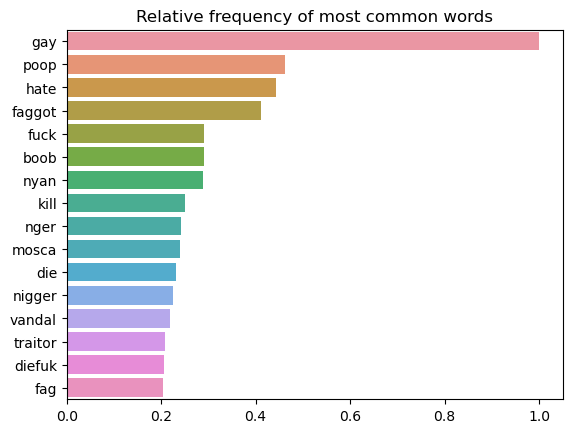

In [372]:
plot_top_non_stopwords_barchart(PIEs_true['comment_text'])

In [373]:
PIEs_true

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
1,Dear god this site is horrible,0,0,0,0,0,0
56,This is just bizarre Ani Medjools abuse of wik...,0,0,0,0,0,0
61,black mamba Itis ponious snake of the word an...,0,0,0,0,0,0
102,Bitch Creek Cow Camp Idaho Hey Just a heads u...,0,0,0,0,0,0
148,You have my trust But trust me on this checku...,0,0,0,0,0,0
...,...,...,...,...,...,...,...
63408,ZANGIEF IS NOT GAY HEY LINDSAY DUDE IS YOU AR...,1,0,1,0,1,1
63503,WTF Who the F put a userbox saying that I was...,1,0,1,0,1,1
63641,Fanatics How dare you delete my post because y...,0,0,0,0,0,0
63723,His career aspiration is to become a Christia...,1,0,1,0,1,1


## Performance analysis on PIEs / nonPIEs at 0.5 threshold

In [254]:
#roc_auc(outputs, 'BERT')
#roc_auc(outputs_db, 'DistilBERT')

#roc_auc(non_PIEs_bert_probs, 'BERT on non PIEs', non_PIEs_true)
#roc_auc(non_PIEs_dbert_probs, 'DistilBERT on non PIEs', non_PIEs_true)


#roc_auc(PIEs_bert_probs, 'BERT on PIEs', PIEs_true)
#roc_auc(PIEs_dbert_probs, 'DistilBERT on PIEs', PIEs_true)

'should f1 score scale uniformly?, try different precision recall ratios, calculate f1 with same threshold as above'


'should f1 score scale uniformly?, try different precision recall ratios, calculate f1 with same threshold as above'

## Accuracy

In [255]:
#Balanced accuracies on PIEs, nonPIEs, normal set, adj = False
balanced_acc = {}
runs = ['BERT', 'DistilBERT', 'BERT PIE', 'DistilBERT PIE', 'BERT and DistilBERT non PIE']
acc = []
acc+=[class_accuracy(outputs, 'BERT')]
acc+=[class_accuracy(outputs_db, 'DistilBERT')]
acc+=[class_accuracy(PIEs_bert_probs, 'BERT PIE', y_true = PIEs_true)]
acc+=[class_accuracy(PIEs_dbert_probs, 'DistilBERT PIE', y_true = PIEs_true)]
acc+=[class_accuracy(non_PIEs_bert_probs, 'BERT and DistilBERT non PIE', y_true = non_PIEs_true)]

balanced_acc = {run: acc[i] for i,run in enumerate(runs)}

BERT Accuracy
╒═══════════════╤════════════╕
│ Class         │   Accuracy │
╞═══════════════╪════════════╡
│ toxic         │   0.911703 │
├───────────────┼────────────┤
│ severe_toxic  │   0.740141 │
├───────────────┼────────────┤
│ obscene       │   0.887581 │
├───────────────┼────────────┤
│ threat        │   0.781222 │
├───────────────┼────────────┤
│ insult        │   0.871403 │
├───────────────┼────────────┤
│ identity_hate │   0.775152 │
╘═══════════════╧════════════╛
average score 0.8278669847544927

DistilBERT Accuracy
╒═══════════════╤════════════╕
│ Class         │   Accuracy │
╞═══════════════╪════════════╡
│ toxic         │   0.903129 │
├───────────────┼────────────┤
│ severe_toxic  │   0.724279 │
├───────────────┼────────────┤
│ obscene       │   0.883852 │
├───────────────┼────────────┤
│ threat        │   0.696126 │
├───────────────┼────────────┤
│ insult        │   0.862068 │
├───────────────┼────────────┤
│ identity_hate │   0.761809 │
╘═══════════════╧════════════╛
av

In [325]:
#balanced_acc

In [324]:
#Non-Balanced accuracies on PIEs, nonPIEs, normal set
non_balanced_acc = {}
runs = ['BERT', 'DistilBERT', 'BERT PIE', 'DistilBERT PIE', 'BERT and DistilBERT non PIE']
acc = []
acc+=[class_accuracy(outputs, 'BERT', balanced = False)]
acc+=[class_accuracy(outputs_db, 'DistilBERT', balanced = False)]
acc+=[class_accuracy(PIEs_bert_probs, 'BERT PIE', y_true = PIEs_true, balanced = False)]
acc+=[class_accuracy(PIEs_dbert_probs, 'DistilBERT PIE', y_true = PIEs_true, balanced = False)]
acc+=[class_accuracy(non_PIEs_bert_probs, 'BERT and DistilBERT non PIE', y_true = non_PIEs_true, balanced = False)]

non_balanced_acc = {run: acc[i] for i,run in enumerate(runs)}

#class_accuracy(non_PIEs_dbert_probs, 'DistilBERT non PIE', y_true = non_PIEs_true)

"#Non-Balanced accuracies on PIEs, nonPIEs, normal set\nnon_balanced_acc = {}\nruns = ['BERT', 'DistilBERT', 'BERT PIE', 'DistilBERT PIE', 'BERT and DistilBERT non PIE']\nacc = []\nacc+=[class_accuracy(outputs, 'BERT', balanced = False)]\nacc+=[class_accuracy(outputs_db, 'DistilBERT', balanced = False)]\nacc+=[class_accuracy(PIEs_bert_probs, 'BERT PIE', y_true = PIEs_true, balanced = False)]\nacc+=[class_accuracy(PIEs_dbert_probs, 'DistilBERT PIE', y_true = PIEs_true, balanced = False)]\nacc+=[class_accuracy(non_PIEs_bert_probs, 'BERT and DistilBERT non PIE', y_true = non_PIEs_true, balanced = False)]\n\nnon_balanced_acc = {run: acc[i] for i,run in enumerate(runs)}\n"

## ROC AUC

In [323]:

auc = {}
runs = ['BERT', 'DistilBERT', 'BERT PIE', 'DistilBERT PIE', 'BERT non PIE', 'DistilBERT non PIE']
auc = []

auc+=[roc_auc(outputs, 'BERT')]
auc+=[roc_auc(outputs_db, 'DistilBERT')]
auc+=[roc_auc(PIEs_bert_probs, 'BERT on PIEs', PIEs_true)]
auc+=[roc_auc(PIEs_dbert_probs, 'DistilBERT on PIEs', PIEs_true)]
auc+=[roc_auc(non_PIEs_bert_probs, 'BERT on non PIEs', non_PIEs_true)]
auc+=[roc_auc(non_PIEs_dbert_probs, 'DistilBERT on non PIEs', non_PIEs_true)]

roc_auc = {run: auc[i] for i,run in enumerate(runs)}


"\nauc = {}\nruns = ['BERT', 'DistilBERT', 'BERT PIE', 'DistilBERT PIE', 'BERT non PIE', 'DistilBERT non PIE']\nauc = []\n\nauc+=[roc_auc(outputs, 'BERT')]\nauc+=[roc_auc(outputs_db, 'DistilBERT')]\nauc+=[roc_auc(PIEs_bert_probs, 'BERT on PIEs', PIEs_true)]\nauc+=[roc_auc(PIEs_dbert_probs, 'DistilBERT on PIEs', PIEs_true)]\nauc+=[roc_auc(non_PIEs_bert_probs, 'BERT on non PIEs', non_PIEs_true)]\nauc+=[roc_auc(non_PIEs_dbert_probs, 'DistilBERT on non PIEs', non_PIEs_true)]\n\nroc_auc = {run: auc[i] for i,run in enumerate(runs)}\n"

## Precision Recall

In [259]:
'''
def precision_recall(outputs, model_name, test_labels = test_labels ,classes = classes):    
    
    p_r = []
    
    for category in classes:
        p_r += [precision_recall_curve(test_labels[category].astype(int), outputs[category])]
    print(model_name)
    print(p_r)
    
    data = list(zip(classes, p_r))
    col_names = ['Class', 'Precision', 'Recall' ]
    print(tabulate(data, headers=col_names, tablefmt="fancy_grid"))
     
    return data
'''

def precision_recall(outputs, model_name, test_labels = test_labels, classes = classes):

    fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3)
    axes = [ax1,ax2,ax3, ax4, ax5,ax6]
    fig.suptitle('Precision recall curve')

    aucs = []
    
    print(model_name)
    for i,category in enumerate(classes):
        
        ax = axes[i]
        
        y_test = test_labels[category].to_numpy().astype(int)
        probs = outputs[category]

        # predict class values
        precision, recall, _ = precision_recall_curve(y_test, probs)
        aucs+=  [auc_score(recall, precision).round(3)]
       

        # plot the precision-recall curves
        no_skill = y_test[y_test==1].shape[0] / y_test.shape[0]
        
        ax.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
        ax.plot(recall, precision, marker='.', label=model_name)
        
        # axis labels
        ax.set_title(category, color = 'gray')
        
    for ax in fig.get_axes():
        ax.label_outer()
        
    fig.text(0.5, 0.01, 'Recall', ha='center', va='center')
    fig.text(0.02, 0.5, 'Precision', ha='center', va='center', rotation='vertical')

    # show the legend
    #fig.legend()
        # show the plot
    for i,category in enumerate(classes):
        print('Class: {}, auc= {}'.format(category,aucs[i]))
    
    print('Average score: {}'.format((sum(aucs)/len(aucs))))

In [322]:
#precision_recall(outputs, 'BERT')

In [321]:
#precision_recall(PIEs_dbert, 'DistilBERT', PIEs_true)


In [320]:
#balanced_acc

In [263]:
p_b = roc_auc['DistilBERT non PIE']
print([score[1].round(3) for score in p_b ])

[0.976, 0.989, 0.984, 0.995, 0.983, 0.99]


## Examining bias in dataset

In [305]:
def filter_frame(frame, keyword=None, length=None):
    """Filters DataFrame to comments that contain the keyword as a substring and fit within length."""
    if keyword:
        frame = frame[frame['comment_text'].str.contains(keyword, case=False)]
    if length:
        frame['length'] = [len(comment) for comment in frame['comment_text']]
        frame = frame[frame['length'] <= length]
    return frame

def class_balance(frame, keyword, length=None):
    """Returns the fraction of the dataset labeled toxic."""
    frame = filter_frame(frame, keyword, length)
    if len(frame)!= 0:
        return len(frame[frame['toxic']==1]) / len(frame)
    return 0.0

def class_balance_in_preds(frame, keyword, length=None):
    """Returns the fraction of the dataset labeled toxic."""
    frame = filter_frame(frame, keyword, length)
    if len(frame)!= 0:
        return len(frame[frame['pred_toxic']>0.5]) / len(frame)
    return 0.0

TEST_TERMS = ['tall', 'short',
              'lesbian', 'gay', 'bisexual', 'transgender', 'queer', 'nonbinary',
              'homosexual', 'heterosexual', 'straight',
              'muslim', 'jewish', 'jew', 'christian','feminist', 
               'african', 'black', 'white', 'latino', 'latina', 'asian', 'mexican', 'american',
              'deaf', 'blind', 'elderly']

print('TRAINING SET')
print('overall class balance        {:.1f}%\t{} examples'.format(
    100 * class_balance(df_tr, keyword=None), len(df_tr)))

for fraction, num, term in sorted((class_balance(df_tr, term),
                                   len(filter_frame(df_tr, term)),
                                   term)
                                  for term in TEST_TERMS):
    print('class balance for {:10s} {:.1f}%\t{} examples'.format(term, 100 * fraction, num))

In [265]:
print('overall fraction of comments containing "gay" labeled toxic:', class_balance(df_tr, keyword='gay'))
print('overall fraction of comments containing "latino" labeled toxic:', class_balance(df_tr, keyword='latino'))

overall fraction of comments containing "gay" labeled toxic: 0.5469061876247505
overall fraction of comments containing "latino" labeled toxic: 0.1702127659574468


In [313]:
TEST_TERMS = ['tall', 'short',
              'lesbian', 'gay', 'bisexual', 'transgender', 'queer', 'nonbinary',
              'homosexual', 'heterosexual', 'straight',
              'muslim', 'jewish', 'jew', 'christian','feminist', 
               'african', 'black', 'white', 'latino', 'latina', 'asian', 'mexican', 'american',
              'deaf', 'blind', 'elderly']

print('TRAINING SET')
print('overall class balance        {:.1f}%\t{} examples'.format(
    100 * class_balance(df_tr, keyword=None), len(df_tr)))

for fraction, num, term in sorted((class_balance(df_tr, term),
                                   len(filter_frame(df_tr, term)),
                                   term)
                                  for term in TEST_TERMS):
    print('class balance for {:10s} {:.1f}%\t{} examples'.format(term, 100 * fraction, num))

TRAINING SET
overall class balance        9.6%	159571 examples
class balance for nonbinary  0.0%	0 examples
class balance for latina     0.0%	18 examples
class balance for short      2.7%	2620 examples
class balance for elderly    4.3%	23 examples
class balance for bisexual   4.8%	42 examples
class balance for african    5.3%	452 examples
class balance for christian  6.7%	1175 examples
class balance for heterosexual 7.0%	43 examples
class balance for tall       7.0%	2371 examples
class balance for american   7.7%	2412 examples
class balance for straight   8.8%	716 examples
class balance for jewish     9.2%	763 examples
class balance for asian      10.4%	367 examples
class balance for muslim     10.5%	744 examples
class balance for feminist   11.7%	77 examples
class balance for white      12.0%	1512 examples
class balance for black      12.3%	1458 examples
class balance for blind      12.5%	440 examples
class balance for jew        16.2%	1514 examples
class balance for latino     17.0%	

In [405]:
TEST_TERMS = ['tall', 'short',
              'lesbian', 'gay', 'bisexual', 'transgender', 'queer', 'nonbinary',
              'homosexual', 'heterosexual', 'straight',
              'muslim', 'jewish', 'jew', 'christian','feminist', 
               'african', 'black', 'white', 'latino', 'latina', 'asian', 'mexican', 'american',
              'deaf', 'blind', 'elderly']


TEST_TERMS = ['lesbian','gay', 'bisexual', 'transgender','trans','queer','lgbt','lgbtq','homosexual','straight',
         'heterosexual', 'male','female', 'nonbinary', 'african','african american', 'black', 'white','european', 'hispanic', 'latino', 'latina', 
         'latinx','mexican','canadian', 'american asian', 'indian', 'middle eastern','chinese','japanese','christian','muslim', 'jewish', 'buddhist',
         'catholic','protestant','sikh', 'taoist', 'older', 'young', 'younger','teenage', 'millenial','middle aged', 'elderly', 'blind','deaf', 'paralyzed']




num_terms = []
print('TEST SET')
print('overall class balance        {:.1f}%\t{} examples'.format(
    100 * class_balance(df_bert, keyword=None), len(df_bert)))

for fraction, num, term in sorted((class_balance(df_bert, term),
                                   len(filter_frame(df_bert, term)),
                                   term)
                                  for term in TEST_TERMS):
    
    num_terms.append(num)
    print('class balance for {:10s} {:.1f}%\t{} examples'.format(term, 100 * fraction, num))

TEST SET
overall class balance        9.5%	63978 examples
class balance for latinx     0.0%	0 examples
class balance for american asian 0.0%	1 examples
class balance for nonbinary  0.0%	1 examples
class balance for paralyzed  0.0%	1 examples
class balance for taoist     0.0%	1 examples
class balance for lgbtq      0.0%	2 examples
class balance for middle aged 0.0%	2 examples
class balance for millenial  0.0%	2 examples
class balance for elderly    0.0%	6 examples
class balance for sikh       0.0%	15 examples
class balance for deaf       0.0%	19 examples
class balance for latino     0.0%	19 examples
class balance for younger    0.0%	55 examples
class balance for older      2.3%	345 examples
class balance for buddhist   2.4%	41 examples
class balance for trans      2.7%	1227 examples
class balance for catholic   3.5%	198 examples
class balance for lgbt       3.7%	54 examples
class balance for canadian   3.8%	157 examples
class balance for african american 4.0%	50 examples
class balance f

In [317]:
TEST_TERMS = ['tall', 'short',
              'lesbian', 'gay', 'bisexual', 'queer',
              'homosexual', 'heterosexual', 'straight',
              'muslim', 'jewish', 'jew', 'christian','feminist', 
               'african', 'black', 'white', 'asian', 'mexican', 'american' ]

print('BERT PREDICTIONS')

print('overall class balance        {:.1f}%\t{} examples'.format(
    100 * class_balance(predictions, keyword=None), len(predictions)))

for fraction, num, term in sorted((class_balance(predictions, term),
                                   len(filter_frame(predictions, term)),
                                   term)
                                  for term in TEST_TERMS):
    print('class balance for {:10s} {:.1f}%\t{} examples'.format(term, 100 * fraction, num))
    
print('DistilBERT PREDICTIONS')

print('overall class balance        {:.1f}%\t{} examples'.format(
    100 * class_balance(predictions_db, keyword=None), len(predictions_db)))

for fraction, num, term in sorted((class_balance(predictions_db, term),
                                   len(filter_frame(predictions_db, term)),
                                   term)
                                  for term in TEST_TERMS):
    print('class balance for {:10s} {:.1f}%\t{} examples'.format(term, 100 * fraction, num))

BERT PREDICTIONS
overall class balance        15.8%	63978 examples
class balance for short      5.6%	1079 examples
class balance for african    9.8%	215 examples
class balance for straight   11.3%	274 examples
class balance for american   11.4%	1004 examples
class balance for tall       11.8%	901 examples
class balance for christian  12.5%	441 examples
class balance for asian      13.9%	158 examples
class balance for heterosexual 14.8%	27 examples
class balance for jewish     14.9%	323 examples
class balance for black      16.6%	818 examples
class balance for white      16.7%	732 examples
class balance for jew        19.6%	725 examples
class balance for mexican    20.8%	77 examples
class balance for muslim     22.3%	264 examples
class balance for feminist   24.3%	37 examples
class balance for bisexual   31.2%	32 examples
class balance for homosexual 32.1%	190 examples
class balance for lesbian    54.0%	63 examples
class balance for queer      57.5%	40 examples
class balance for gay    

In [406]:
TEST_TERMS = ['tall', 'short',
              'lesbian', 'gay', 'bisexual', 'transgender', 'queer', 'nonbinary',
              'homosexual', 'heterosexual', 'straight',
              'muslim', 'jewish', 'jew', 'christian','feminist', 
               'african', 'black', 'white', 'latino', 'latina', 'asian', 'mexican', 'american',
              'deaf', 'blind', 'elderly']


TEST_TERMS = ['lesbian','gay', 'bisexual', 'transgender','trans','queer','lgbt','lgbtq','homosexual','straight',
         'heterosexual', 'male','female','nonbinary', 'african','african american', 'black', 'white','european', 'hispanic', 'latino', 'latina', 
         'latinx','mexican','canadian', 'american asian', 'indian', 'middle eastern','chinese','japanese','christian','muslim', 'jewish', 'buddhist',
         'catholic','protestant','sikh', 'taoist', 'older', 'young', 'younger','teenage', 'millenial','middle aged', 'elderly', 'blind','deaf', 'paralyzed']

print('PIEs TRUE')

print('overall class balance        {:.1f}%\t{} examples'.format(
    100 * class_balance(PIEs_true, keyword=None), len(PIEs_true)))


num_terms_pie = []
for fraction, num, term in sorted((class_balance(PIEs_true, term),
                                   len(filter_frame(PIEs_true, term)),
                                   term)
                                  for term in TEST_TERMS):
    num_terms_pie.append(num)
    print('class balance for {:10s} {:.1f}%\t{} examples'.format(term, 100 * fraction, num))

PIEs TRUE
overall class balance        41.9%	4557 examples
class balance for american asian 0.0%	0 examples
class balance for buddhist   0.0%	0 examples
class balance for deaf       0.0%	0 examples
class balance for hispanic   0.0%	0 examples
class balance for latinx     0.0%	0 examples
class balance for lgbtq      0.0%	0 examples
class balance for middle aged 0.0%	0 examples
class balance for millenial  0.0%	0 examples
class balance for nonbinary  0.0%	0 examples
class balance for paralyzed  0.0%	0 examples
class balance for protestant 0.0%	0 examples
class balance for sikh       0.0%	0 examples
class balance for taoist     0.0%	0 examples
class balance for elderly    0.0%	1 examples
class balance for latino     0.0%	1 examples
class balance for transgender 0.0%	1 examples
class balance for younger    0.0%	1 examples
class balance for blind      7.7%	13 examples
class balance for chinese    22.2%	9 examples
class balance for indian     26.3%	19 examples
class balance for catholic   28

In [319]:
print('BERT PIE PREDICTIONS')

print('overall class balance        {:.1f}%\t{} examples'.format(
    100 * class_balance_in_preds(PIEs_bert.rename(columns = {'toxic': 'pred_toxic'}), keyword=None), len(PIEs_dbert)))

for fraction, num, term in sorted((class_balance_in_preds(PIEs_bert.rename(columns = {'toxic': 'pred_toxic'}), term),
                                   len(filter_frame(PIEs_bert, term)),
                                   term)
                                  for term in TEST_TERMS):
    print('class balance for {:10s} {:.1f}%\t{} examples'.format(term, 100 * fraction, num))

print('DistilBERT PIE PREDICTIONS')

print('overall class balance        {:.1f}%\t{} examples'.format(
    100 * class_balance_in_preds(PIEs_dbert.rename(columns = {'toxic': 'pred_toxic'}), keyword=None), len(PIEs_dbert)))

for fraction, num, term in sorted((class_balance_in_preds(PIEs_dbert.rename(columns = {'toxic': 'pred_toxic'}), term),
                                   len(filter_frame(PIEs_dbert, term)),
                                   term)
                                  for term in TEST_TERMS):
    print('class balance for {:10s} {:.1f}%\t{} examples'.format(term, 100 * fraction, num))

BERT PIE PREDICTIONS
overall class balance        79.3%	4557 examples
class balance for heterosexual 50.0%	4 examples
class balance for african    58.8%	17 examples
class balance for asian      68.8%	16 examples
class balance for queer      69.2%	13 examples
class balance for mexican    70.0%	10 examples
class balance for christian  72.0%	25 examples
class balance for jew        75.2%	117 examples
class balance for jewish     76.9%	39 examples
class balance for tall       77.0%	61 examples
class balance for black      77.8%	81 examples
class balance for american   78.3%	69 examples
class balance for lesbian    80.0%	10 examples
class balance for white      80.0%	65 examples
class balance for short      81.4%	43 examples
class balance for straight   81.8%	11 examples
class balance for homosexual 89.2%	37 examples
class balance for muslim     94.7%	38 examples
class balance for gay        96.0%	225 examples
class balance for feminist   100.0%	3 examples
class balance for bisexual   100.0

In [397]:
matplotlib.scale.get_scale_names()
num_terms.remove(max(num_terms))
num_terms_pie.remove(max(num_terms_pie))

['function', 'functionlog', 'linear', 'log', 'logit', 'symlog']

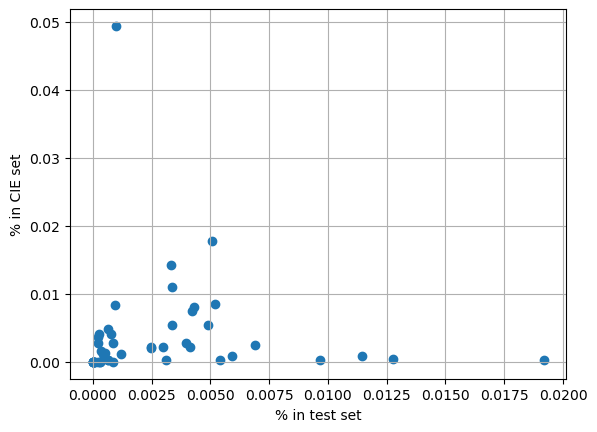

In [411]:
num_terms.remove(max(num_terms))
num_terms_pie.remove(max(num_terms_pie))

test = [n/len(df_bert for n in num_terms]
pie = [n/ len(PIEs_true) for n in num_terms_pie]


plt.xlabel("% in test set")
plt.ylabel("% in CIE set")
plt.grid()
plt.scatter(test, pie)

In [417]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', 5000)

PIEs_true[PIEs_true['toxic'] == 1]

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
294,GIVE BLOWJOBS TO HOT WOMEN FROM ALDERLEY EDGE CHESHIRE,1,0,1,0,0,0
541,Because the overall aim of the project is worth putting up with this for Because there is sometimes some personal learning involved in the topic research which is itself a worthwhile goal Otherwise no reason You can put up with the shit if you wish to its not usually too onerous Even the idiocy isnt too painful youre only required to make the show of being civil to the fools not to respect them,1,0,0,0,1,0
655,Utterly utterly tiny insignificant anal retentive thing but Its later learned that Dan Marino was about to be kidnap and join with Snowflake you missed a ped at the end of kidnap,1,0,0,0,0,0
1219,FIRESTAR IS A POWER HUNGRY ARSE,1,0,0,0,0,0
1330,copied over from where he keeps censoring anything he doesnt like and consider anyone who pronounces Amharic with in English to be an ignorant idiot wiktprescriptivist Youre welcome,1,0,0,0,1,0
1373,make those kickass userboxes,1,0,1,0,0,0
1386,I was involved in a lot of articles surrounding Canwest how exactly did this senior wiki editor restrict the canwest article Sock puppet Double standard Hypocrites To haida chieftain Youre a disruptive troll Youre actions are embarrassing and not at all encyclopedic I was involved in a lot of articles surrounding Canwest you know NOTHING Take your soapbox and start a blog somewhere wwwthesmokingguncom or some crap like that Embarrasment Yours truly Suck puppet Bwilkins,1,0,0,0,0,0
1902,Good Bye Intoronto RIP Hope to see you in hell VelupillaiSOB,1,0,0,0,0,0
2041,It is ridiculous but congrats all the same The Pathan thing is outrageous They probably wont even read what they copypaste As for plagiarism this piece was copied from a vandalised version of the World Cup article by an idiot journalist who put it in Financial Express the real BCCI President was NKP Salve,1,0,1,0,1,0
2183,juicy butt holes,1,0,0,0,0,0


In [ ]:
terms = ['lesbian','gay', 'bisexual', 'transgender', 'bisexual','transgender','trans','queer','lgbt','lgbtq','homosexual','straight',
         'heterosexual', 'male','female','nonbinary', 'african','african american', 'black', 'white','european', 'hispanic', 'latino', 'latina', 
         'latinx','mexican','canadian', 'american asian', 'indian', 'middle eastern','chinese','japanese','christian','muslim', 'jewish', 'buddhist',
         'catholic','protestant','sikh', 'taoist', 'old', 'older', 'young', 'younger','teenage', 'millenial','middle aged', 'elderly', 'blind','deaf', 'paralyzed']